### Loan Prediction Exploratory Data Analysis (EDA)

In [2]:
# Import python packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Load the dataset
data = pd.read_csv('Loan_default.csv')


In [4]:
# Data wrangling
data = pd.get_dummies(data, columns = ['HasCoSigner', 'Education', 'EmploymentType', 'MaritalStatus', 'HasMortgage', 'HasDependents', 'LoanPurpose'], drop_first=True)
bool_to_float = lambda x: float(x) if isinstance(x, bool) else x
columns_to_convert = ['Education_High School',
                      "Education_Master's", 'Education_PhD', 'EmploymentType_Part-time',
                      'EmploymentType_Self-employed', 'EmploymentType_Unemployed',
                      'MaritalStatus_Married', 'MaritalStatus_Single', 'HasMortgage_Yes',
                      'HasDependents_Yes', 'LoanPurpose_Business', 'LoanPurpose_Education',
                      'LoanPurpose_Home', 'LoanPurpose_Other', 'HasCoSigner_Yes']
data[columns_to_convert] = data[columns_to_convert].map(bool_to_float)
data=data.drop('LoanID', axis =1)


Now that my data is clean, I am ready to begin exploratory data analysis.  My goal for this portion of the project is to gain valuable insights from the data.  What does the data tell us?  What is our hypothesis? How does the data support our hypothesis? Many more questions should arise from EDA. So let's begin. My first step is to look for any outliers.

In [5]:
def treat_outliers(df,col):
    '''
    treats outliers in a variable
    df: data frame
    col: name of the column
    '''

    Q1 = np.nanquantile(df[col], 0.25) # 25th quantile
    Q3 = np.nanquantile(df[col], 0.75)  # 75th quantile
    IQR = Q3 - Q1   # IQR Range
    Lower_Whisker = Q1 - 1.5*IQR  #define lower whisker
    Upper_Whisker = Q3 + 1.5*IQR  # define upper Whisker
    df[col] = np.clip(df[col], Lower_Whisker, Upper_Whisker) # all the values smaller than Lower_Whisker will be assigned value of Lower_whisker
    # and all the values above upper_whisker will be assigned value of upper_Whisker
    return df

def treat_outliers_all(df, col_list):
    '''
    treat outlier in all numerical variables
    col_list: list of numerical variables
    df: data frame
    '''
    for c in col_list:
        df = treat_outliers(df,c)

    return df
numerical_cols = data.columns[0:8]
print(numerical_cols)
treat_outliers_all(data, numerical_cols)
print(data.shape)

Index(['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed',
       'NumCreditLines', 'InterestRate', 'LoanTerm'],
      dtype='object')
(255347, 25)


The shape remained the same.  This is great because this means our data does not have any outliers.  Next, I will visualize the data for insights beginning with a pairplot.

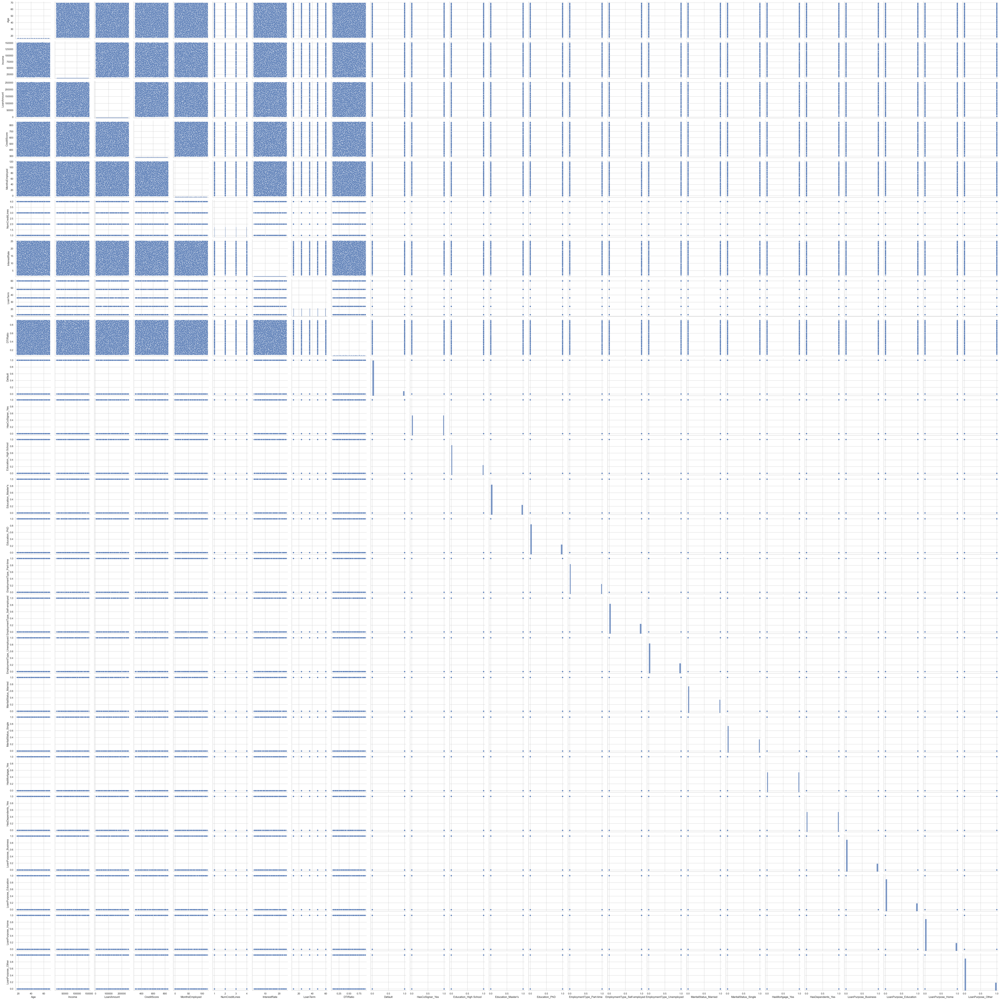

In [6]:
sns.pairplot(data)
plt.show()

There are too many pairplots to get a sense of anything.  I will need to write code to display larger, fewer pairplots per row. Therefore, I can have a better visualization of the data.

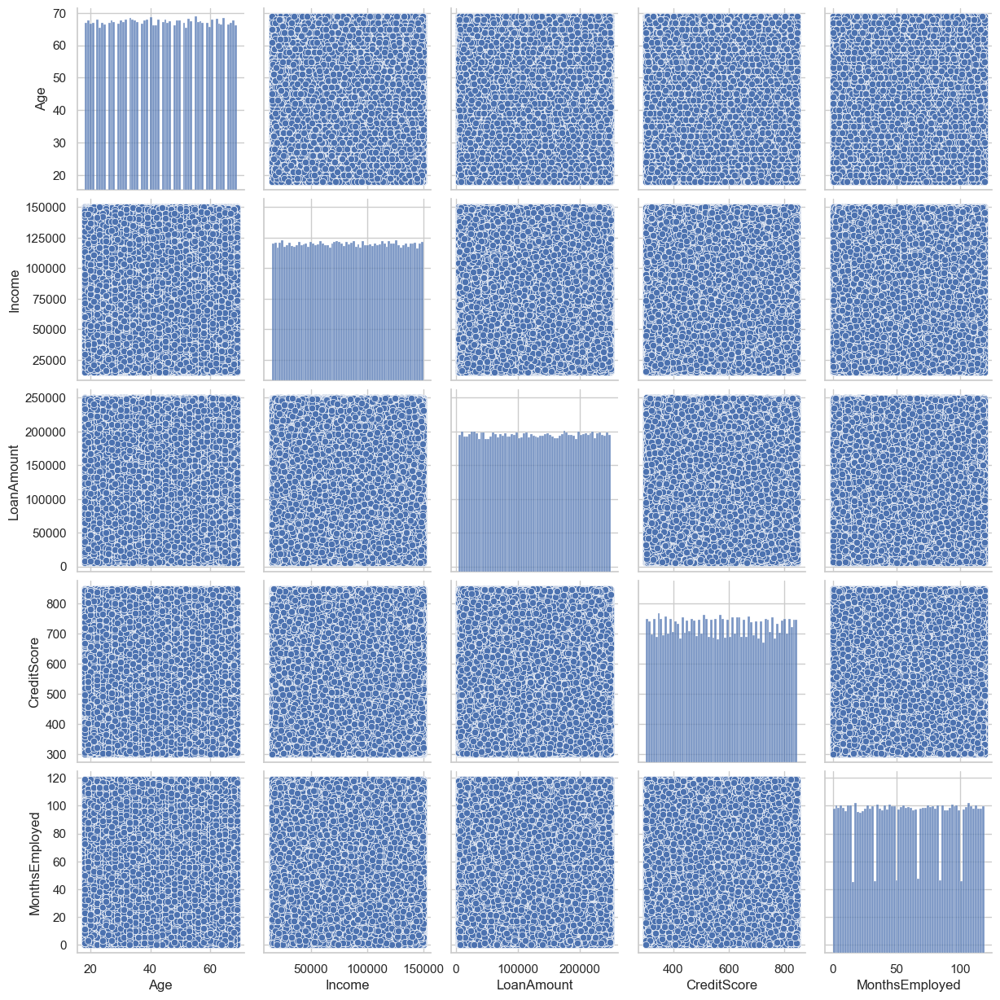

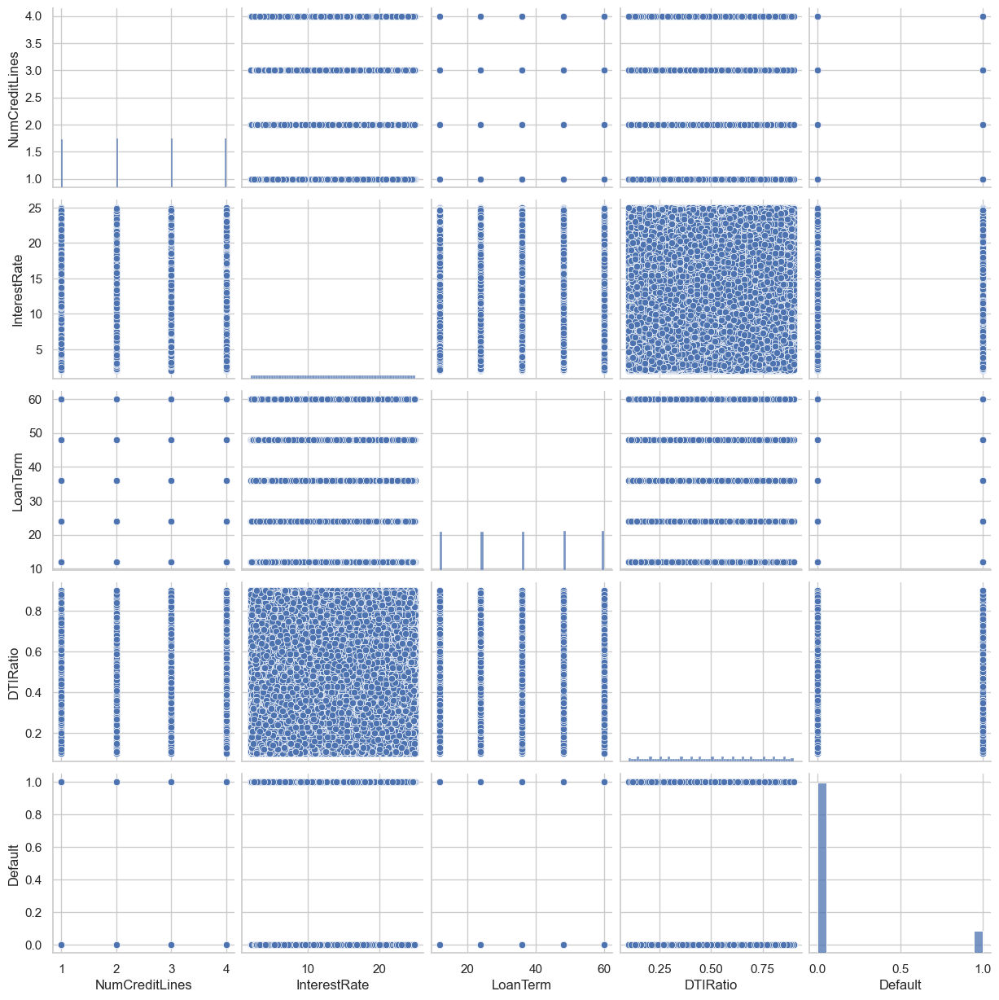

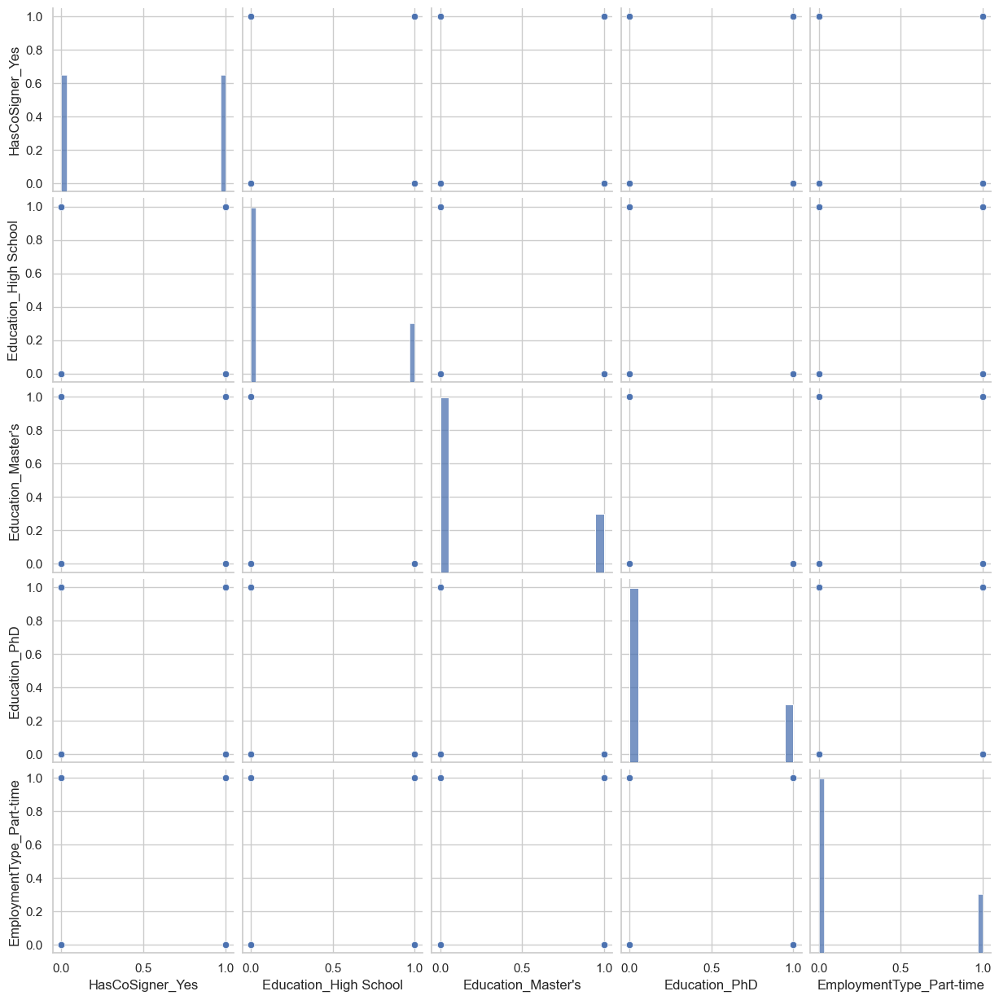

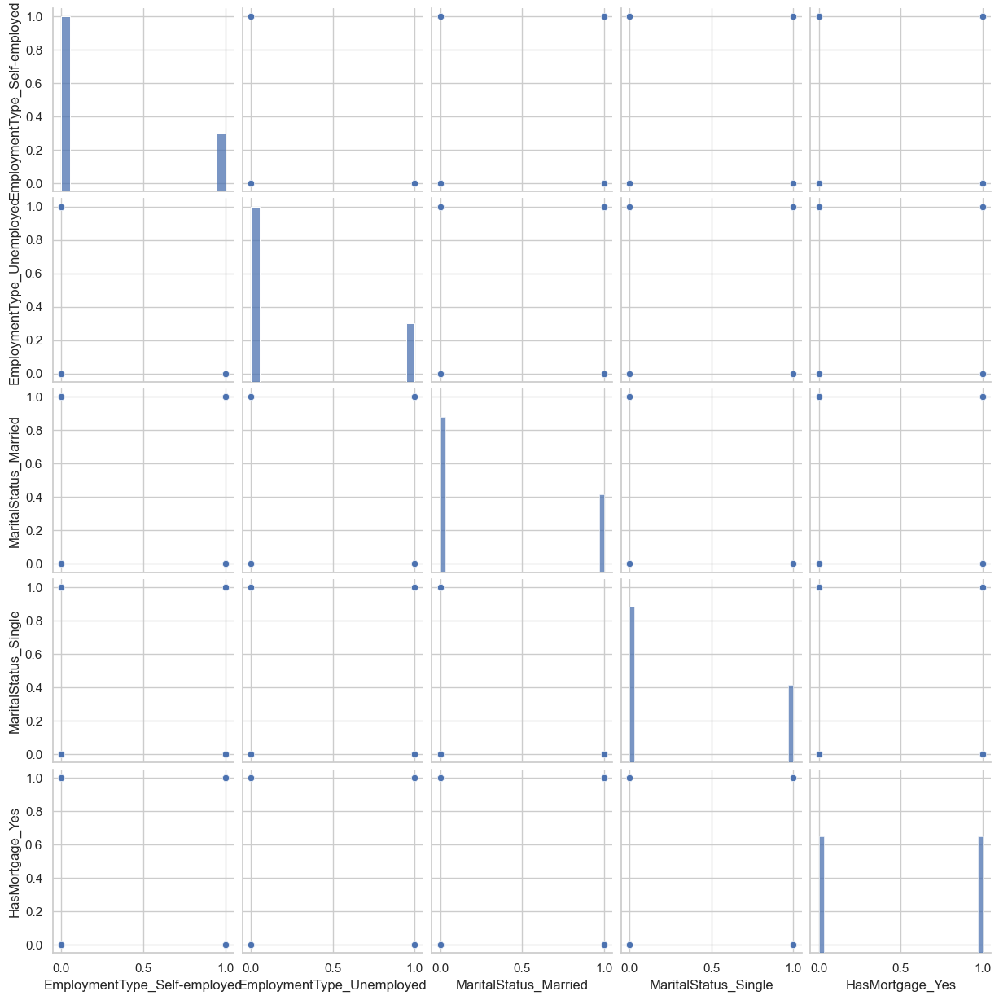

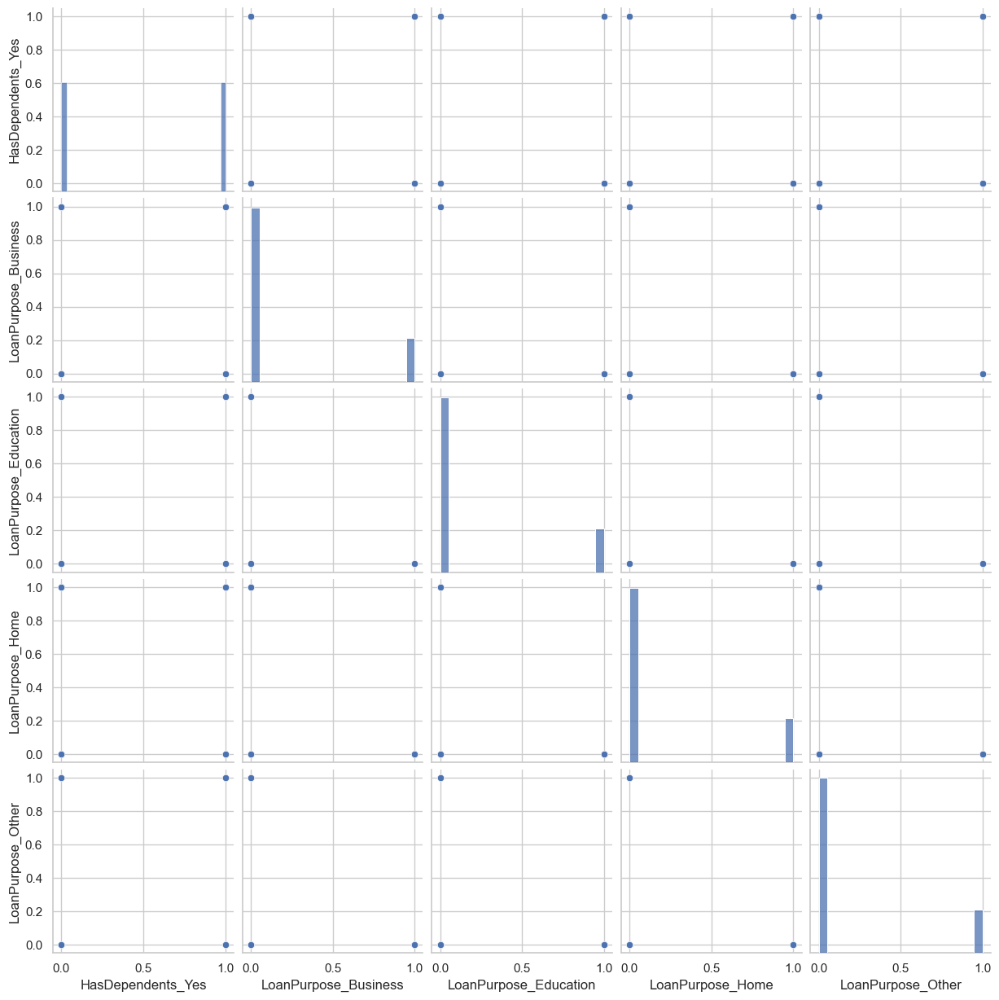

In [7]:
num_cols_per_row = 5

# Get the list of numerical columns you want to visualize
columns = data.columns

# Calculate the total number of pairplots
total_pairplots = len(columns)

# Calculate the number of rows needed for the pairplots
num_rows = -(-total_pairplots // num_cols_per_row)  # Ceiling division

# Loop through the range of rows
for i in range(num_rows):
    # Calculate the start and end indices for each row
    start_idx = i * num_cols_per_row
    end_idx = min((i + 1) * num_cols_per_row, total_pairplots)

    # Get the subset of numerical columns for the current row
    subset_columns = columns[start_idx:end_idx]

    # Create a pairplot for the current subset
    sns.pairplot(data[subset_columns])

    # Show the plot
    plt.show()

The pairplots are much easier to read with only 5 pairplots per row.  Unfortunately, nothing immediately jumps out from the pairplot visualization.  Let's try a different type of visualization.  My next visualization will be a correlation matrix heatmap.

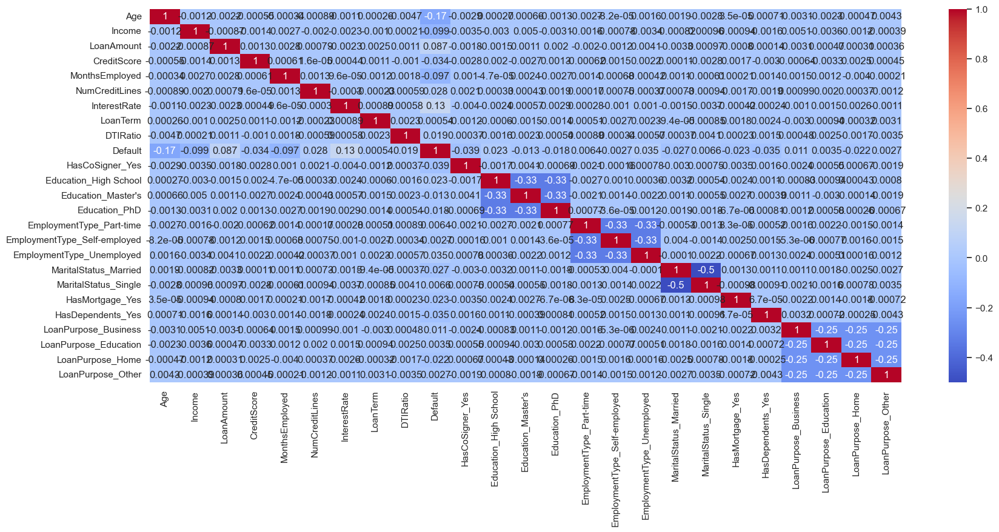

In [8]:
plt.figure(figsize=(20, 8))

correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.show()

The heatmap visualization is much more helpful than the pairplots.  Since our target variable is 'Default', we are looking to identify the most impactful explanatory variables.  From the heatmap, it looks like 'Age', 'Income', 'Loan Amount', 'Months Employed', and 'Interest Rate' have the strongest correlation to 'Default' (some negative, some positive). This is a great first step!  Let's see if any other insights can be inferred from other visualizations.

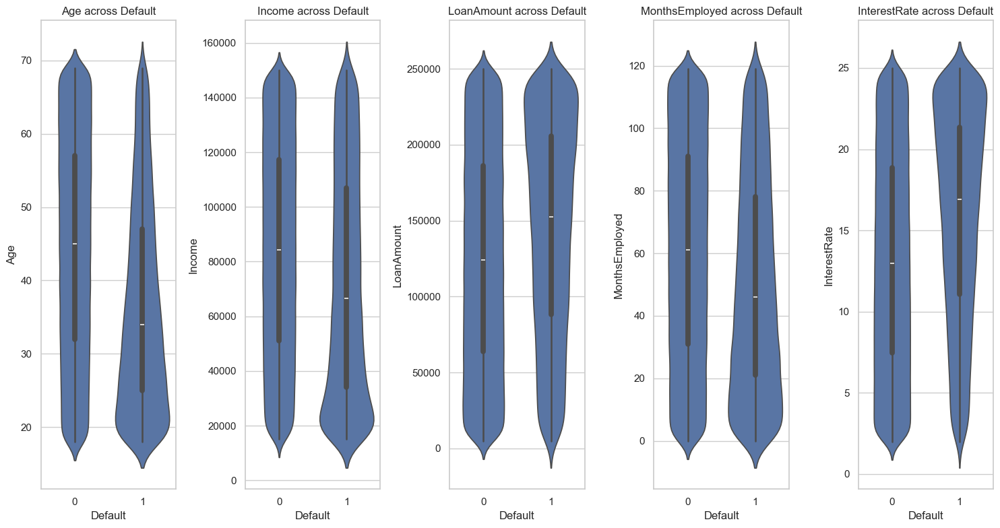

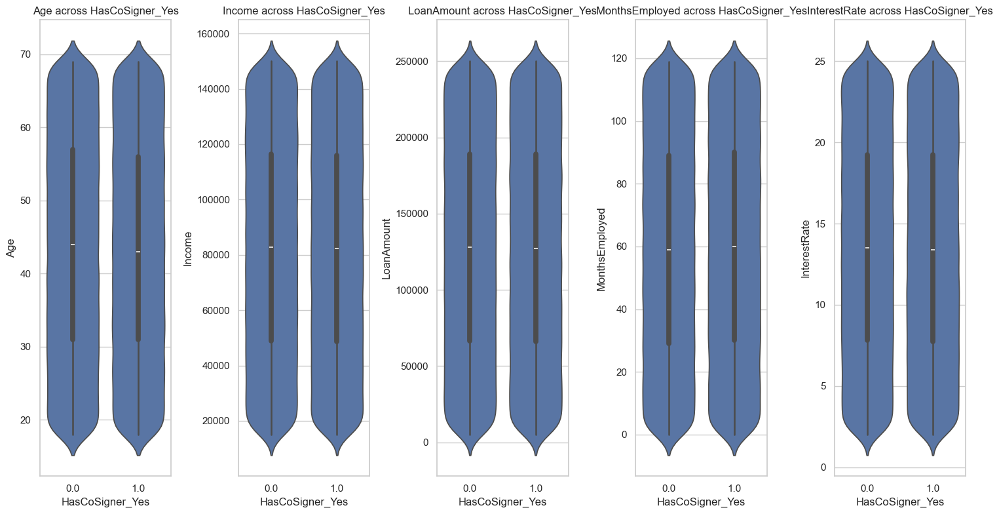

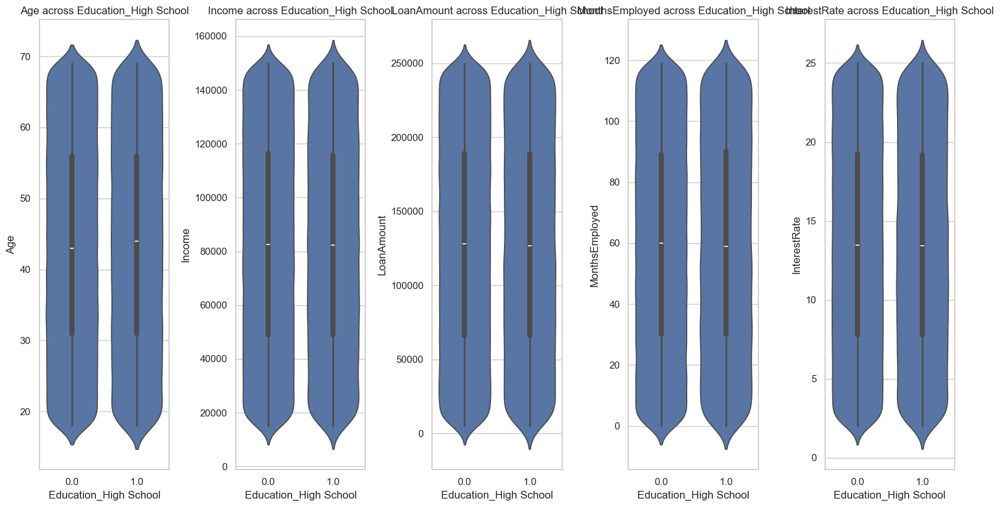

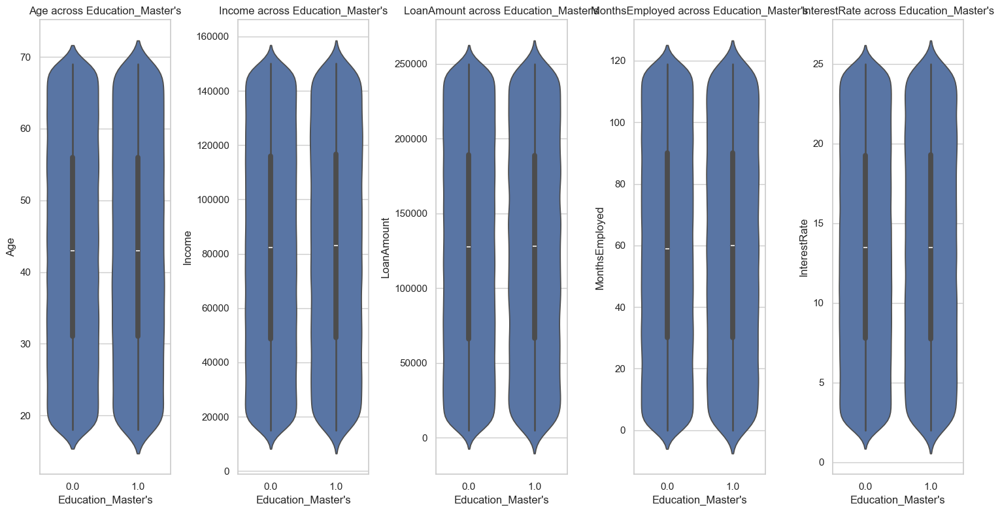

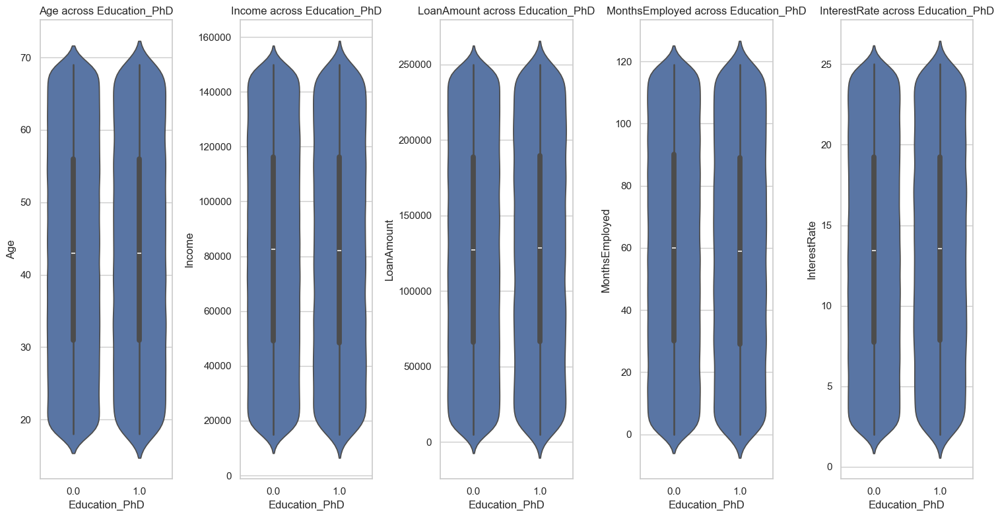

...

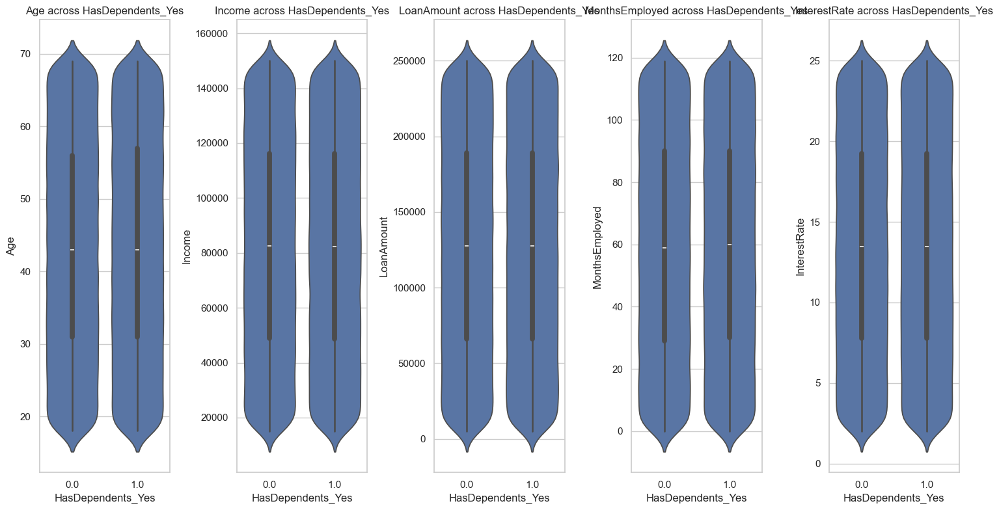

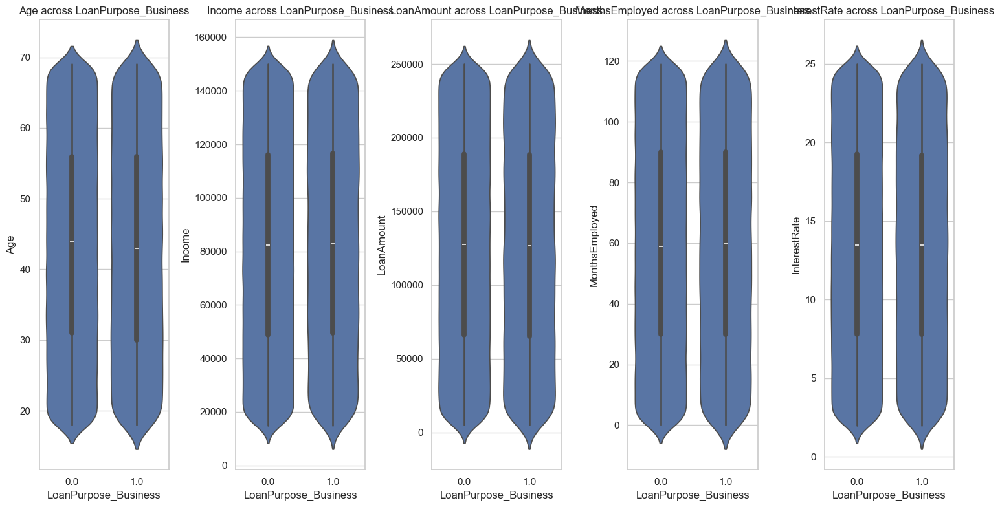

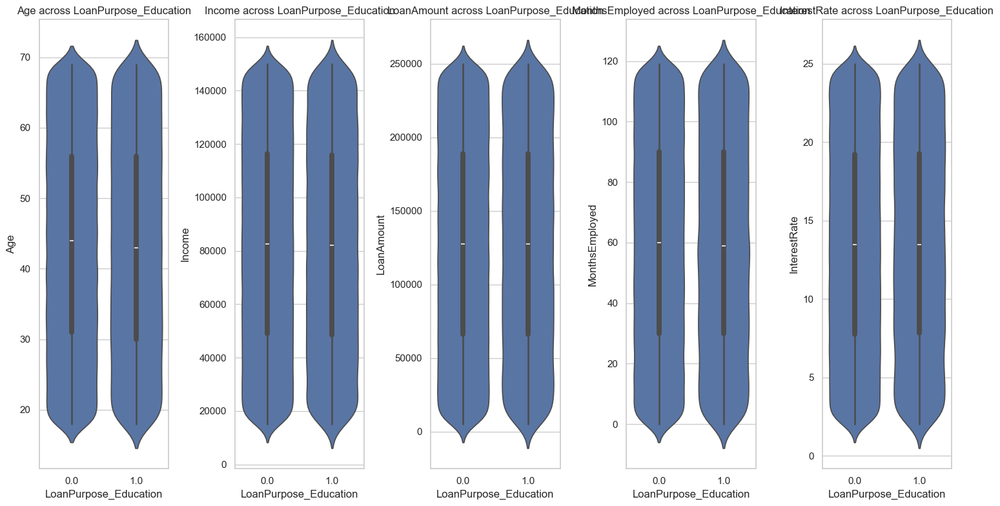

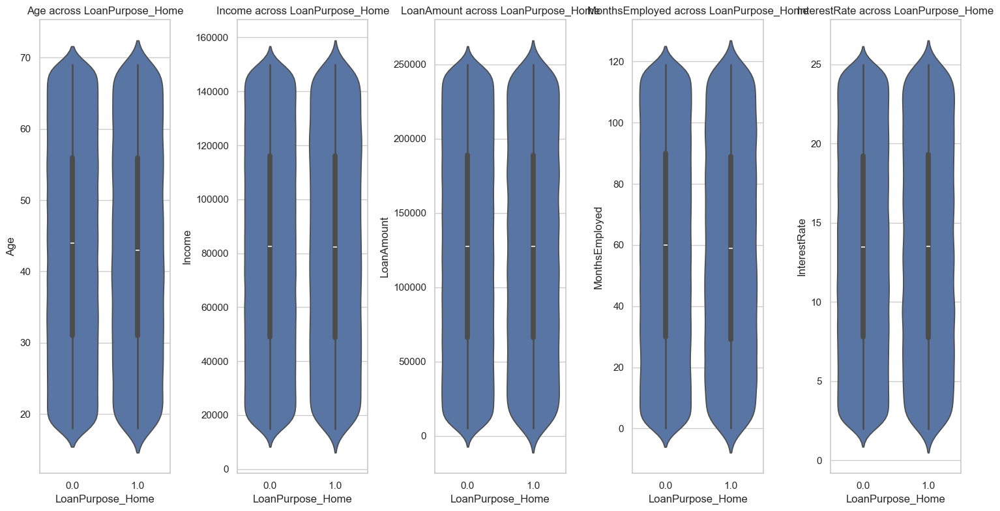

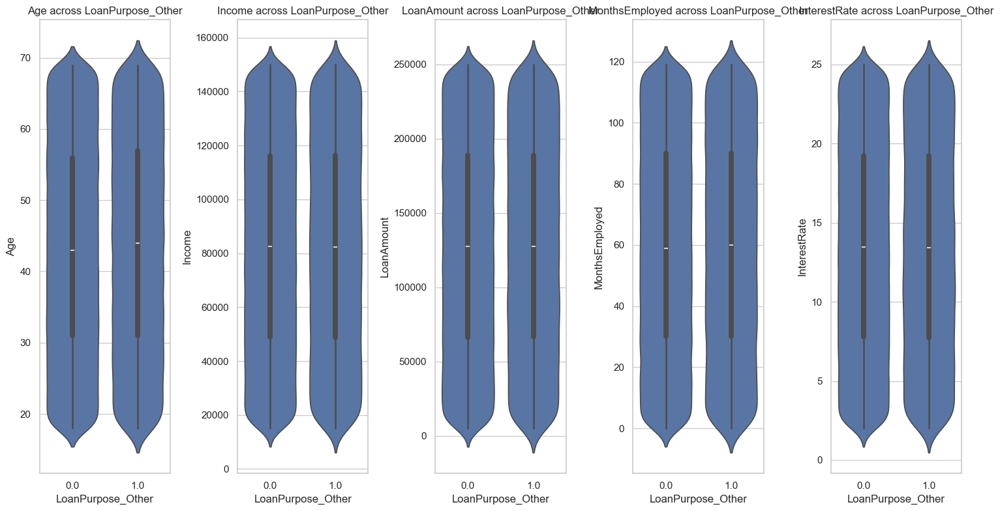

In [9]:
numerical_columns_of_interest = ['Age', 'Income', 'LoanAmount', 'MonthsEmployed', 'InterestRate']
categorical_columns = ['Default', 'HasCoSigner_Yes', 'Education_High School', "Education_Master's", 'Education_PhD', 'EmploymentType_Part-time', 'EmploymentType_Self-employed', 'EmploymentType_Unemployed', 'MaritalStatus_Married', 'MaritalStatus_Single', 'HasMortgage_Yes', 'HasDependents_Yes', 'LoanPurpose_Business', 'LoanPurpose_Education', 'LoanPurpose_Home', 'LoanPurpose_Other']
for column in categorical_columns:
    plt.figure(figsize=(15, 8))  

    
    for i, num_col in enumerate(numerical_columns_of_interest, 1):
        plt.subplot(1, len(numerical_columns_of_interest), i)

        
        sns.violinplot(x=column, y=num_col, data=data)

        plt.title(f'{num_col} across {column}')

    plt.tight_layout()
    plt.show()

The first row of violin plots have the greatest disparity.  All the other violin plots look to be somewhat uniform whereas in the first row, there are noticeable variations with respect to not default (0) and default (1) when compared to the 'Age', 'Income', 'LoanAmount', 'MonthsEmployed', 'InterestRate' columns.

There are a greater number of defaults (wider portion of the violin means greater density) among younger people, lower income, larger loan amounts, and higher interest rates. 

I think it would be wise to look at all the numerical columns instead of just the numerical columns of interest.  

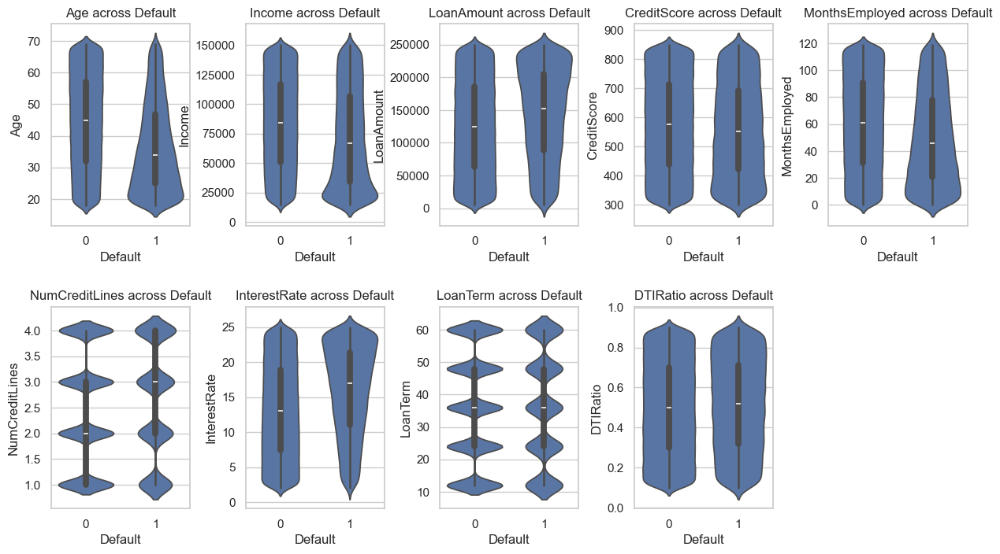

In [10]:
numerical_columns = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio']


plt.figure(figsize=(15, 8))
num_rows = 2  
num_cols = len(numerical_columns) // num_rows + 1
    
for i, num_col in enumerate(numerical_columns, 1):
    plt.subplot(num_rows, num_cols, i)

    
    sns.violinplot(x='Default', y=num_col, data=data)

    plt.title(f'{num_col} across Default')

plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

This is an interesting result. The two variables, Number of Credit Lines and Loan Term, are numeric variables but not continuous (discrete).  It looks like there is a difference between those who defaults and those who did not with the number of credit lines.  The medians are clearly different (2 vs 3). The two medians are the same for the loan term variable.  Let's compare all columns and see what the data says.

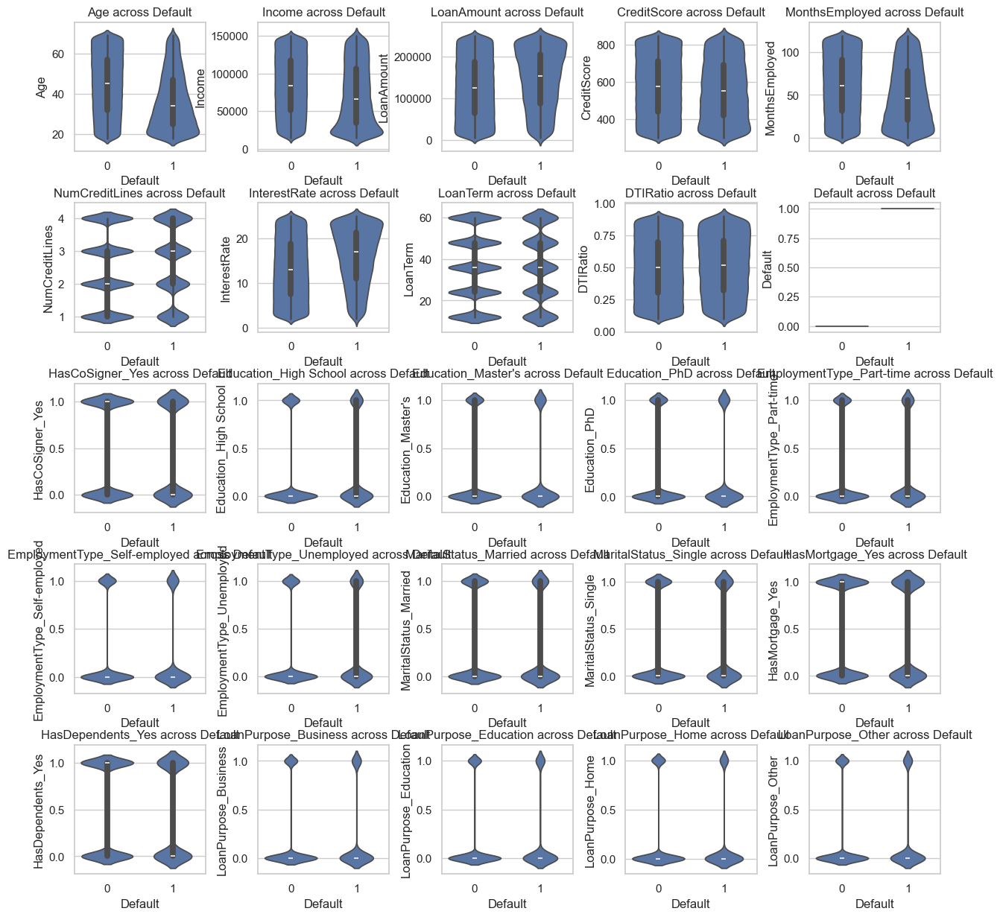

In [11]:
numerical_columns = data.columns



num_rows = 6  
num_cols = len(numerical_columns) // num_rows + 1
plt.figure(figsize=(15, num_rows * 3))

for i, num_col in enumerate(numerical_columns, 1):
    plt.subplot(num_rows, num_cols, i)


    sns.violinplot(x='Default', y=num_col, data=data)

    plt.title(f'{num_col} across Default')

plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

These additional plots do not add any additional insights. I will look to visualize the data differently to gain further insights.  My next visualization will be the boxplot.

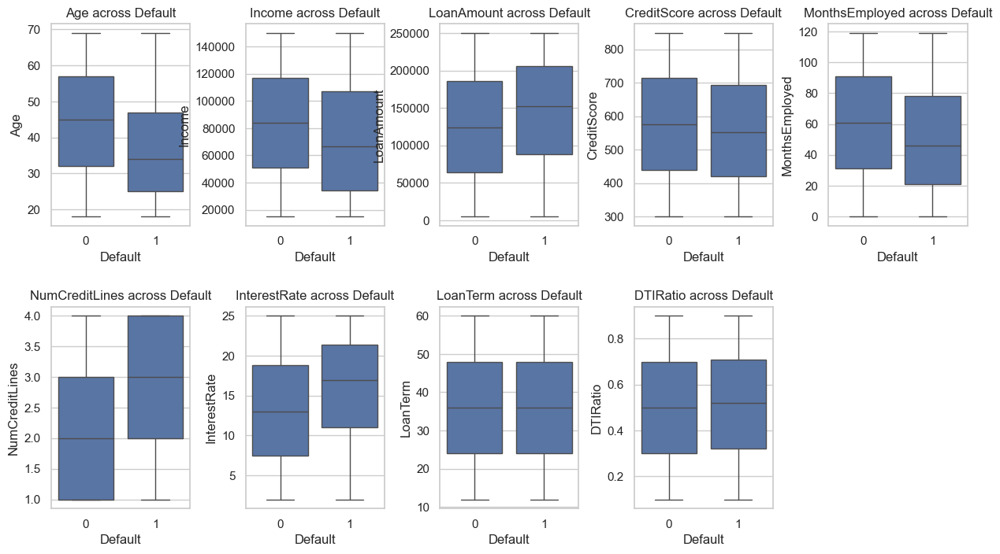

In [12]:
numerical_columns = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio']

plt.figure(figsize=(15, 8))

num_rows = 2
num_cols = len(numerical_columns) // num_rows + 1  

for i, num_col in enumerate(numerical_columns, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(x='Default', y=num_col, data=data)
    plt.title(f'{num_col} across Default')

plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

This is a good start but more is needed.  I want to add summary statistics to the visualizations to help me process the information better.

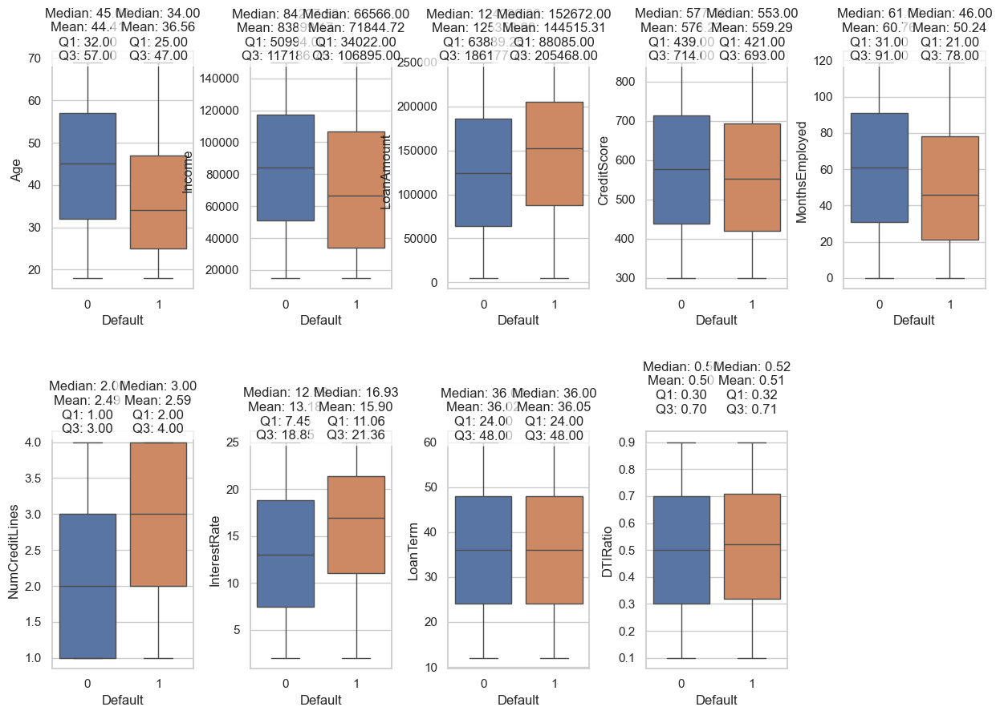

In [13]:
numerical_columns = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio']

plt.figure(figsize=(15, 10))  

num_rows = 2
num_cols = len(numerical_columns) // num_rows + 1  

for i, num_col in enumerate(numerical_columns, 1):
    plt.subplot(num_rows, num_cols, i)

    sns.boxplot(x='Default', y=num_col, data=data, hue='Default', legend = False) 

    # Annotate the boxplot with summary statistics
    for default_category in data['Default'].unique():
        subset_data = data[data['Default'] == default_category][num_col]

        median_val = subset_data.median()
        mean_val = subset_data.mean()
        q1_val = subset_data.quantile(0.25)
        q3_val = subset_data.quantile(0.75)

        plt.text(default_category, subset_data.max() + 0.1,
                 f'Median: {median_val:.2f}\nMean: {mean_val:.2f}\nQ1: {q1_val:.2f}\nQ3: {q3_val:.2f}',
                 ha='center', va='bottom', bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

    

plt.subplots_adjust(wspace=0.4, hspace=0.6)  
plt.show()

By changing the hue and adding summary statistics, it is easier to interpret the plots. I prefer the violin plot to the boxplot.  I will change the hue in the violin plot so it looks similar to these boxplots.  Next, I want to look at a count plot of the dummy variables. I would like to have the summary statistics separate from the box plot which is shown next.

In [14]:
from tabulate import tabulate

numerical_columns = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio']

annotations_list = []

for num_col in numerical_columns:
    annotations = []

    for default_category in data['Default'].unique():
        subset_data = data[data['Default'] == default_category][num_col]

        median_val = subset_data.median()
        mean_val = subset_data.mean()
        min_val = subset_data.min()
        q1_val = subset_data.quantile(0.25)
        q3_val = subset_data.quantile(0.75)
        max_val = subset_data.max()

        # Collect annotations for the current column
        annotations.append({
            'Default': default_category,
            'Median': median_val,
            'Mean': mean_val,
            'Min': min_val,
            'Q1': q1_val,
            'Q3': q3_val,
            'Max': max_val
        })

    # Add annotations for the current column to the overall list
    annotations_list.append({
        'Column': num_col,
        'Annotations': annotations
    })


for col_annotations in annotations_list:
    print(f"\nAnnotations for {col_annotations['Column']}:\n")
    annotations_df = pd.DataFrame(col_annotations['Annotations'])
    print(tabulate(annotations_df, headers='keys', tablefmt='psql'))


Annotations for Age:

+----+-----------+----------+---------+-------+------+------+-------+
|    |   Default |   Median |    Mean |   Min |   Q1 |   Q3 |   Max |
|----+-----------+----------+---------+-------+------+------+-------|
|  0 |         0 |       45 | 44.41   |    18 |   32 |   57 |    69 |
|  1 |         1 |       34 | 36.5595 |    18 |   25 |   47 |    69 |
+----+-----------+----------+---------+-------+------+------+-------+

Annotations for Income:

+----+-----------+----------+---------+-------+-------+--------+--------+
|    |   Default |   Median |    Mean |   Min |    Q1 |     Q3 |    Max |
|----+-----------+----------+---------+-------+-------+--------+--------|
|  0 |         0 |  84237.5 | 83899.2 | 15000 | 50994 | 117187 | 149999 |
|  1 |         1 |  66566   | 71844.7 | 15004 | 34022 | 106895 | 149995 |
+----+-----------+----------+---------+-------+-------+--------+--------+

Annotations for LoanAmount:

+----+-----------+----------+--------+-------+---------+-

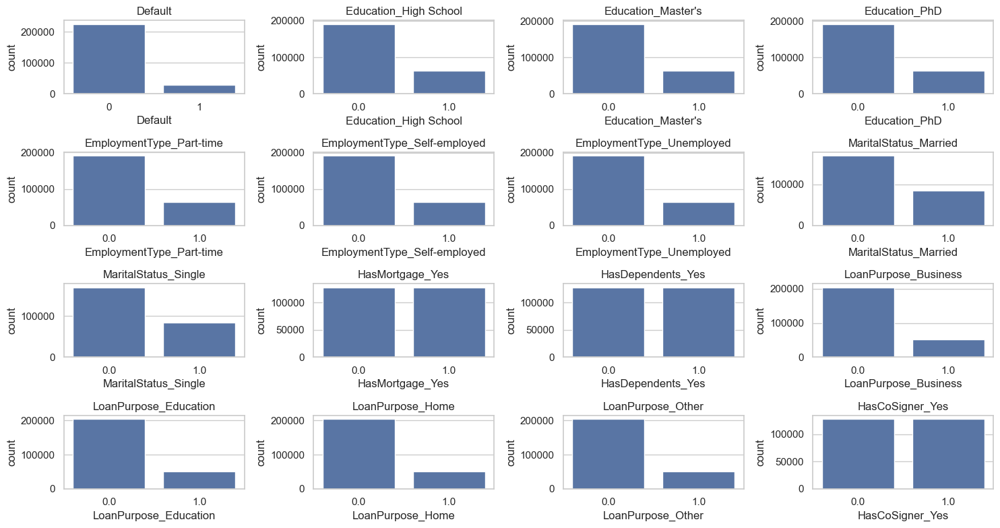

In [15]:
columns_to_explore = ['Default', 'Education_High School', "Education_Master's", 'Education_PhD',
                      'EmploymentType_Part-time', 'EmploymentType_Self-employed', 'EmploymentType_Unemployed',
                      'MaritalStatus_Married', 'MaritalStatus_Single', 'HasMortgage_Yes',
                      'HasDependents_Yes', 'LoanPurpose_Business', 'LoanPurpose_Education',
                      'LoanPurpose_Home', 'LoanPurpose_Other', 'HasCoSigner_Yes']

num_cols = 4
num_rows = (len(columns_to_explore) - 1) // num_cols + 1

plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")


for i, column in enumerate(columns_to_explore, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.countplot(x=column, data=data)
    plt.title(column)

plt.tight_layout()
plt.show()

This plot is helpful because it shows that there is clearly a class imbalance in the 'Default' column.  There is a considerably higher number of non-defaults than defaults.  How many exactly? And what about the other categorical variables? Are they also imbalanced? Let's find out. 

In [16]:
print(data['Default'].value_counts())

Default
0    225694
1     29653
Name: count, dtype: int64


In [17]:
default_counts = data['Default'].value_counts()


default_percentage = (default_counts / len(data)) * 100

print(default_percentage)

Default
0    88.387175
1    11.612825
Name: count, dtype: float64


88.39% of the data consists of non-defaults while 11.61% of the data consists of defaults. This is a clear class imbalance which will need to be taken into consideration when looking at different machine learning models. I will most likely need to resample my data to get a more balanced dataset.  This is something I will do in the next section.  

Going back to the countplots,  we want to ensure there is a balance in the data but because these are dummy variables, we want to compare the counts of "1's" not "0's" except for 'HasDependents_Yes', 'HasCoSigner_Yes', and 'HasMortgage_Yes' since they are already binary.

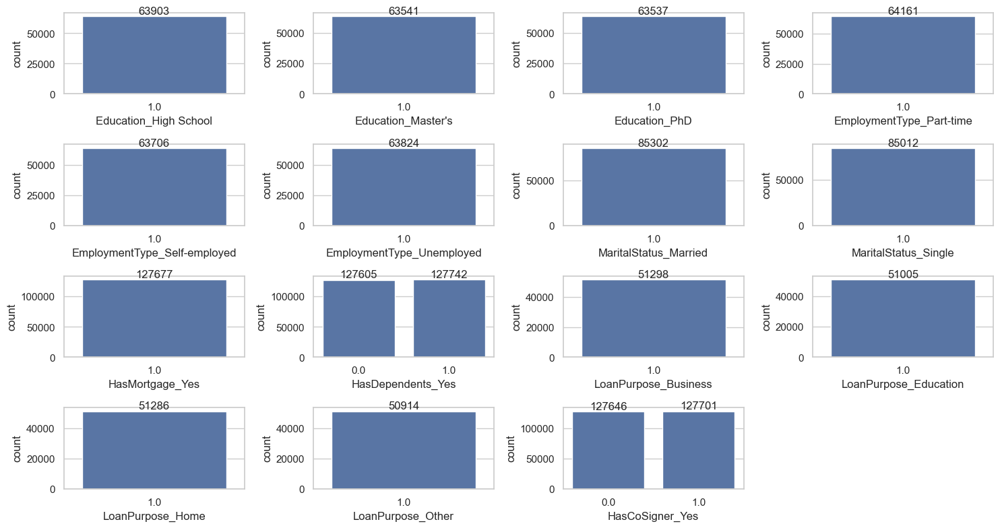

In [18]:
columns_to_explore_minus_default = ['Education_High School', "Education_Master's", 'Education_PhD',
                      'EmploymentType_Part-time', 'EmploymentType_Self-employed', 'EmploymentType_Unemployed',
                      'MaritalStatus_Married', 'MaritalStatus_Single', 'HasMortgage_Yes',
                      'HasDependents_Yes', 'LoanPurpose_Business', 'LoanPurpose_Education',
                      'LoanPurpose_Home', 'LoanPurpose_Other', 'HasCoSigner_Yes']
plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")

# Create subplots for each categorical variable
for i, column in enumerate(columns_to_explore_minus_default, 1):
    ax = plt.subplot(num_rows, num_cols, i)

    
    if column in ['HasDependents_Yes', 'HasCoSigner_Yes']:
        filtered_data = data
    else:
        filtered_data = data[data[column] == 1]

    sns.countplot(x=column, data=filtered_data)

    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2., p.get_height(), f'{int(p.get_height())}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

I believe the following plots are the most useful and are displayed below:
- Heatmap
The heatmap provided an excellent starting point of which explanatory variables to further investigate.
- Violin Plot
The violin plot provided a clear visualization of the differences between defaults and non-defaults across the numeric explanatory variables.
- Annotation Table
The annotation table provides important summary statistics related to the explanatory and target variable.
- Count Plots
The count plot helped identify class imbalance for default but showed balance among the other categorical variables.

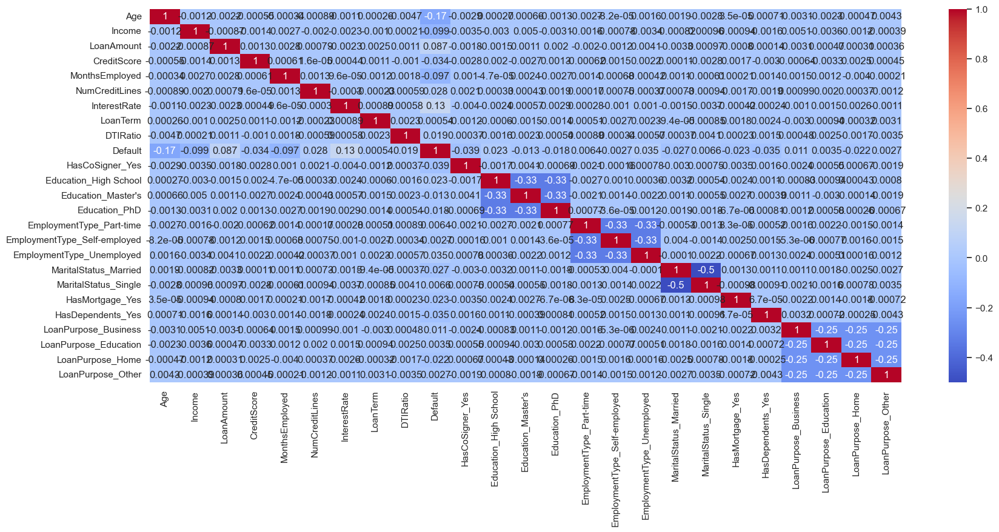

In [19]:
plt.figure(figsize=(20, 8))

correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.show()

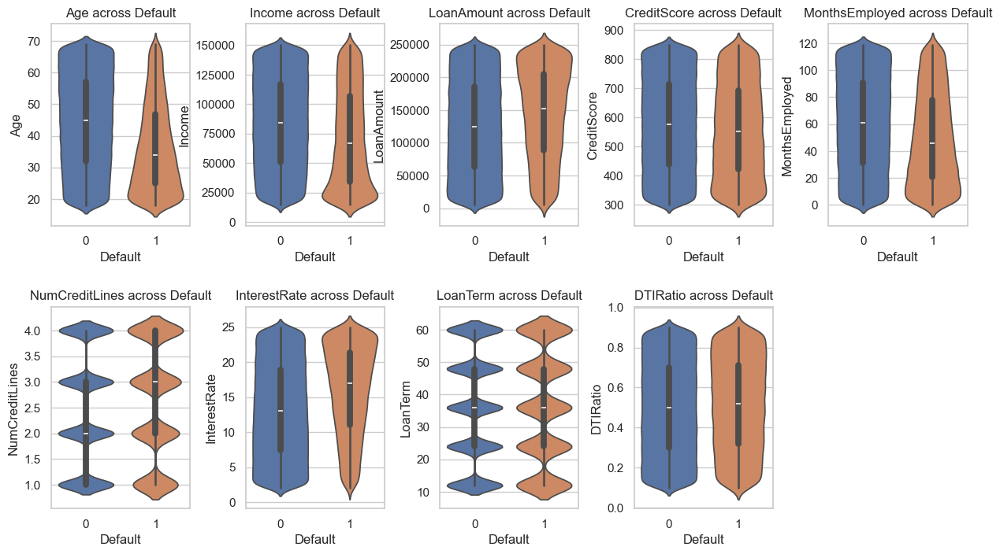

In [20]:
numerical_columns = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio']


plt.figure(figsize=(15, 8))
num_rows = 2
num_cols = len(numerical_columns) // num_rows + 1

for i, num_col in enumerate(numerical_columns, 1):
    plt.subplot(num_rows, num_cols, i)


    sns.violinplot(x='Default', y=num_col, data=data, hue='Default', legend = False)

    plt.title(f'{num_col} across Default')

plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

In [21]:
for col_annotations in annotations_list:
    print(f"\nAnnotations for {col_annotations['Column']}:\n")
    annotations_df = pd.DataFrame(col_annotations['Annotations'])
    print(tabulate(annotations_df, headers='keys', tablefmt='psql'))


Annotations for Age:

+----+-----------+----------+---------+-------+------+------+-------+
|    |   Default |   Median |    Mean |   Min |   Q1 |   Q3 |   Max |
|----+-----------+----------+---------+-------+------+------+-------|
|  0 |         0 |       45 | 44.41   |    18 |   32 |   57 |    69 |
|  1 |         1 |       34 | 36.5595 |    18 |   25 |   47 |    69 |
+----+-----------+----------+---------+-------+------+------+-------+

Annotations for Income:

+----+-----------+----------+---------+-------+-------+--------+--------+
|    |   Default |   Median |    Mean |   Min |    Q1 |     Q3 |    Max |
|----+-----------+----------+---------+-------+-------+--------+--------|
|  0 |         0 |  84237.5 | 83899.2 | 15000 | 50994 | 117187 | 149999 |
|  1 |         1 |  66566   | 71844.7 | 15004 | 34022 | 106895 | 149995 |
+----+-----------+----------+---------+-------+-------+--------+--------+

Annotations for LoanAmount:

+----+-----------+----------+--------+-------+---------+-

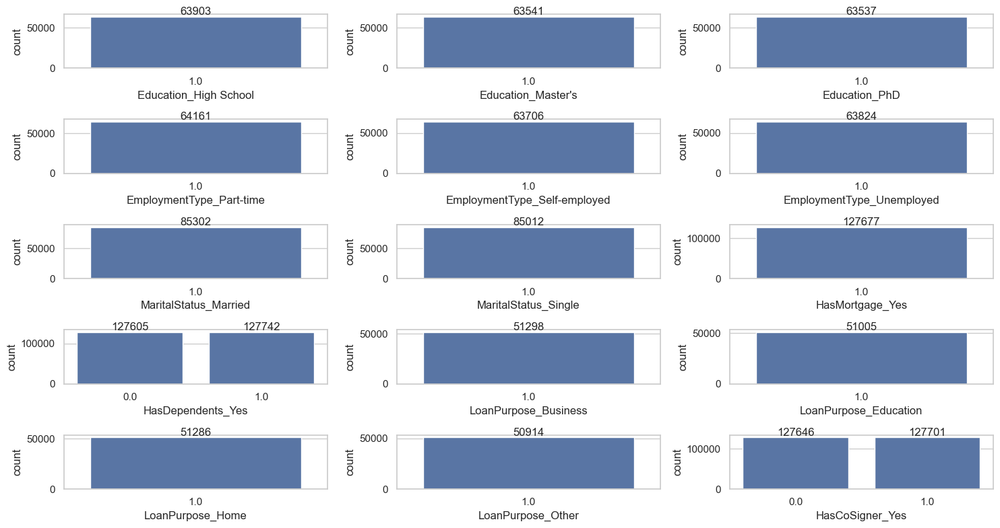

In [22]:


columns_to_explore_minus_default = ['Education_High School', "Education_Master's", 'Education_PhD',
                                    'EmploymentType_Part-time', 'EmploymentType_Self-employed', 'EmploymentType_Unemployed',
                                    'MaritalStatus_Married', 'MaritalStatus_Single', 'HasMortgage_Yes',
                                    'HasDependents_Yes', 'LoanPurpose_Business', 'LoanPurpose_Education',
                                    'LoanPurpose_Home', 'LoanPurpose_Other', 'HasCoSigner_Yes']


num_cols = 3  
num_rows = -(-len(columns_to_explore_minus_default) // num_cols)  

plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")


for i, column in enumerate(columns_to_explore_minus_default, 1):
    ax = plt.subplot(num_rows, num_cols, i)

    if column in ['HasDependents_Yes', 'HasCoSigner_Yes']:
        filtered_data = data
    else:
        filtered_data = data[data[column] == 1]

    sns.countplot(x=column, data=filtered_data)

    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2., p.get_height(), f'{int(p.get_height())}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


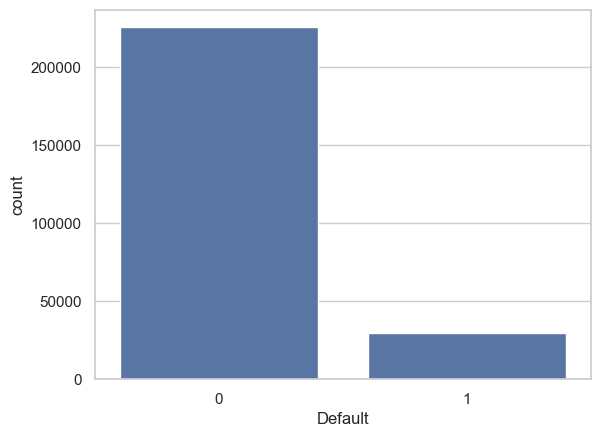

Default
0    88.387175
1    11.612825
Name: count, dtype: float64


In [23]:
sns.countplot(x='Default', data=data)
plt.show()
default_counts = data['Default'].value_counts()


default_percentage = (default_counts / len(data)) * 100

print(default_percentage)

In the next notebook I will work on pre-processing and training data development.